In [29]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [30]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, mean_absolute_error, mean_absolute_percentage_error, mean_squared_error
from sklearn.tree import export_text, plot_tree
import warnings
warnings.filterwarnings("ignore")


In [31]:
data = pd.read_csv("/content/drive/MyDrive/Desision_Tree_ID3/stroke_data.csv" , sep = "," , encoding = 'utf-8')
data

,sex,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,1,63,0,1,1,4,1,228.69,36.6,1,1
1,1,42,0,1,1,4,0,105.92,32.5,0,1
2,0,61,0,0,1,4,1,171.23,34.4,1,1
3,1,41,1,0,1,3,0,174.12,24.0,0,1
4,1,85,0,0,1,4,1,186.21,29.0,1,1
...,...,...,...,...,...,...,...,...,...,...,...
40905,1,38,0,0,0,4,1,120.94,29.7,1,0
40906,0,53,0,0,1,4,0,77.66,40.8,0,0
40907,1,32,0,0,1,2,0,231.95,33.2,0,0
40908,1,42,0,0,1,3,0,216.38,34.5,0,0


In [32]:
data.shape

(40910, 11)

In [33]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40910 entries, 0 to 40909
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   sex                40910 non-null  int64  
 1   age                40910 non-null  int64  
 2   hypertension       40910 non-null  int64  
 3   heart_disease      40910 non-null  int64  
 4   ever_married       40910 non-null  int64  
 5   work_type          40910 non-null  int64  
 6   Residence_type     40910 non-null  int64  
 7   avg_glucose_level  40910 non-null  float64
 8   bmi                40910 non-null  float64
 9   smoking_status     40910 non-null  int64  
 10  stroke             40910 non-null  int64  
dtypes: float64(2), int64(9)
memory usage: 3.4 MB


In [34]:
data.head()

,sex,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,1,63,0,1,1,4,1,228.69,36.6,1,1
1,1,42,0,1,1,4,0,105.92,32.5,0,1
2,0,61,0,0,1,4,1,171.23,34.4,1,1
3,1,41,1,0,1,3,0,174.12,24.0,0,1
4,1,85,0,0,1,4,1,186.21,29.0,1,1


In [35]:
data.describe()

,sex,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
count,40910.000000,40910.000000,40910.000000,40910.000000,40910.000000,40910.000000,40910.000000,40910.000000,40910.000000,40910.000000,40910.000000
mean,0.555145,51.327255,0.213835,0.127719,0.821340,3.461134,0.514886,122.075901,30.406355,0.488609,0.500122
std,0.496956,21.623969,0.410017,0.333781,0.383072,0.780919,0.499784,57.561531,6.835072,0.499876,0.500006
min,0.000000,-9.000000,0.000000,0.000000,0.000000,0.000000,0.000000,55.120000,11.500000,0.000000,0.000000
25%,0.000000,35.000000,0.000000,0.000000,1.000000,3.000000,0.000000,78.750000,25.900000,0.000000,0.000000
50%,1.000000,52.000000,0.000000,0.000000,1.000000,4.000000,1.000000,97.920000,29.400000,0.000000,1.000000
75%,1.000000,68.000000,0.000000,0.000000,1.000000,4.000000,1.000000,167.590000,34.100000,1.000000,1.000000
max,1.000000,103.000000,1.000000,1.000000,1.000000,4.000000,1.000000,271.740000,92.000000,1.000000,1.000000


In [36]:
data.isnull().sum()

sex                  0
age                  0
hypertension         0
heart_disease        0
ever_married         0
work_type            0
Residence_type       0
avg_glucose_level    0
bmi                  0
smoking_status       0
stroke               0
dtype: int64

In [37]:
unique_values = {}
for col in data.columns:
    unique_values[col] = data[col].value_counts().shape[0]

pd.DataFrame(unique_values, index=['unique value count']).transpose()

,unique value count
sex,2
age,111
hypertension,2
heart_disease,2
ever_married,2
work_type,5
Residence_type,2
avg_glucose_level,2903
bmi,370
smoking_status,2


In [38]:
# data.hist(figsize=(20,20));

<Axes: >

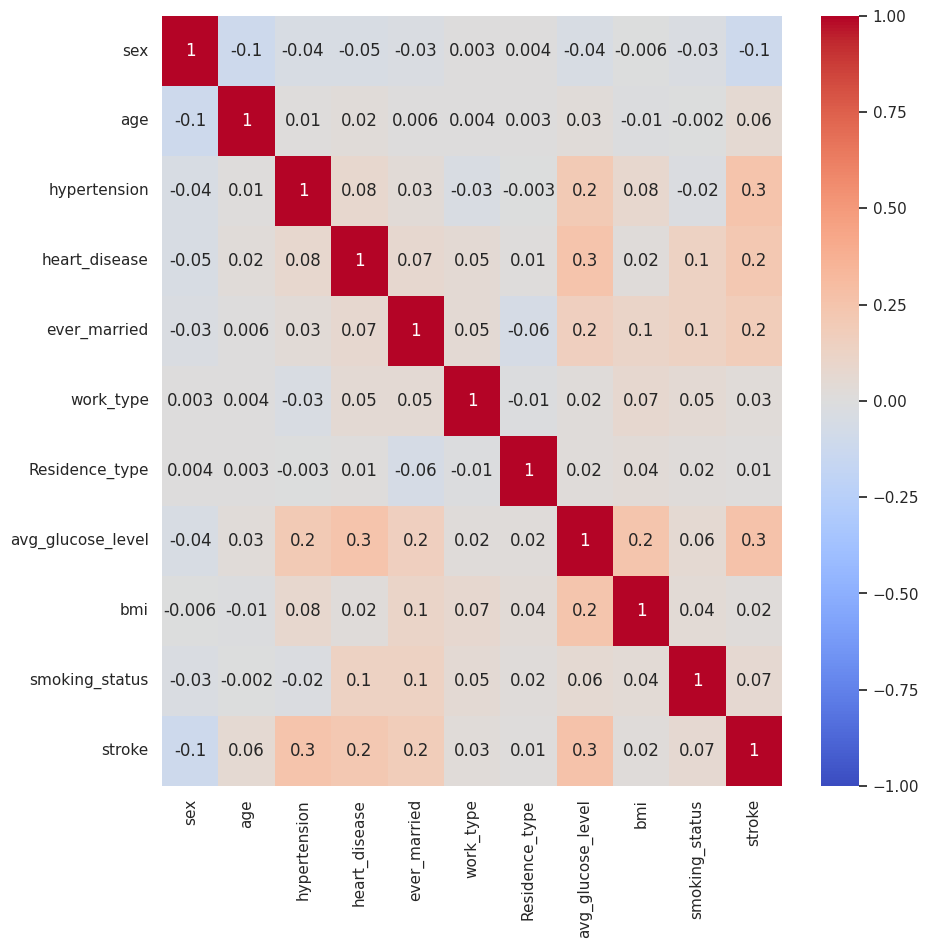

In [39]:
sns.set(rc = {'figure.figsize':(10,10)})
sns.heatmap(data.corr(),vmin=-1, vmax=1, annot = True, fmt='.1g',cmap= 'coolwarm')

In [40]:
data.corr()

,sex,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
sex,1.000000,-0.115190,-0.039159,-0.045335,-0.025995,0.003098,0.003683,-0.039325,-0.006007,-0.028025,-0.110995
age,-0.115190,1.000000,0.014365,0.024541,0.006294,0.003647,0.002686,0.027271,-0.012323,-0.002070,0.058534
hypertension,-0.039159,0.014365,1.000000,0.079968,0.033760,-0.033133,-0.002651,0.203502,0.082386,-0.017813,0.257182
heart_disease,-0.045335,0.024541,0.079968,1.000000,0.071596,0.049382,0.013000,0.252034,0.021374,0.137279,0.223930
ever_married,-0.025995,0.006294,0.033760,0.071596,1.000000,0.051596,-0.057161,0.160268,0.113667,0.137516,0.181656
work_type,0.003098,0.003647,-0.033133,0.049382,0.051596,1.000000,-0.011294,0.018167,0.074723,0.052938,0.026494
Residence_type,0.003683,0.002686,-0.002651,0.013000,-0.057161,-0.011294,1.000000,0.016431,0.037169,0.017704,0.011682
avg_glucose_level,-0.039325,0.027271,0.203502,0.252034,0.160268,0.018167,0.016431,1.000000,0.242823,0.056832,0.265452
bmi,-0.006007,-0.012323,0.082386,0.021374,0.113667,0.074723,0.037169,0.242823,1.000000,0.042448,0.018326
smoking_status,-0.028025,-0.002070,-0.017813,0.137279,0.137516,0.052938,0.017704,0.056832,0.042448,1.000000,0.068368


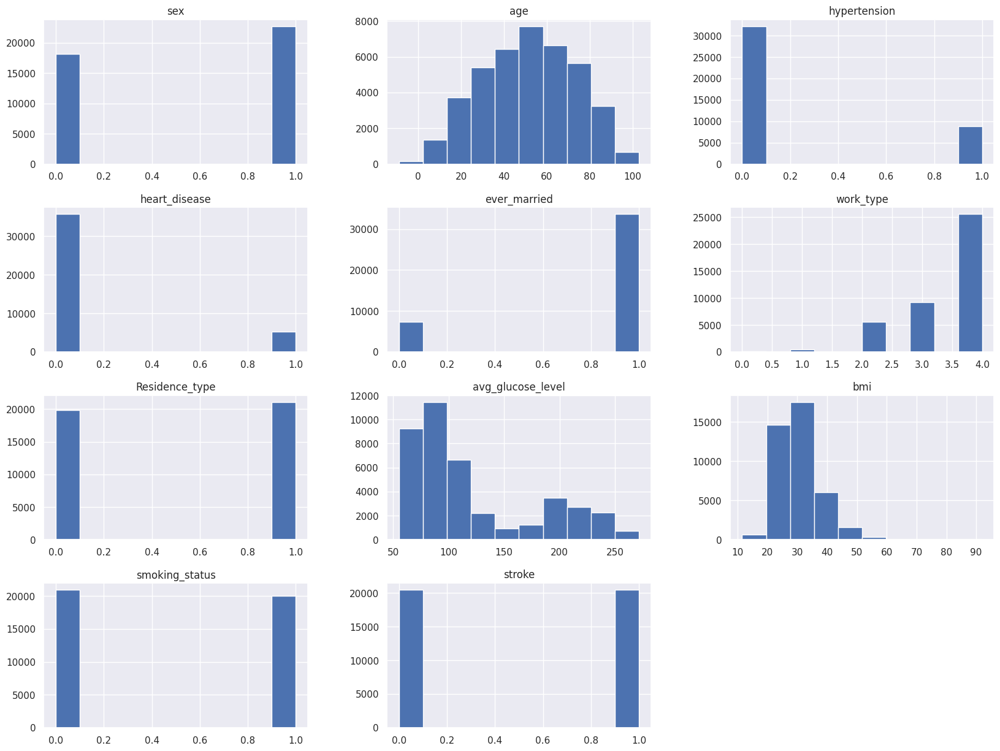

In [41]:
data.hist(figsize=(20,15));

In [42]:
  # sns.pairplot(data,hue='stroke',palette = ["#8000ff","#da8829"])
  # plt.show()

[]

<Figure size 1500x1000 with 0 Axes>

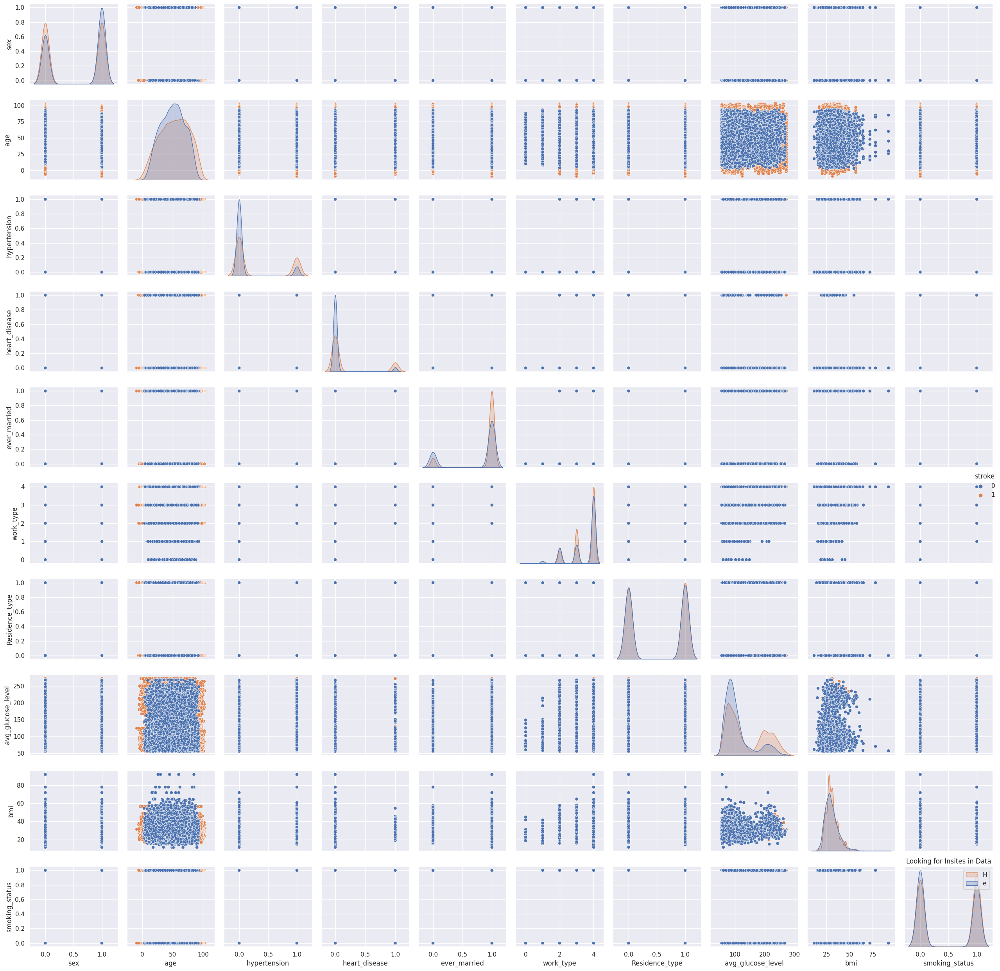

In [43]:
df = data
plt.figure(figsize=(15,10))
sns.pairplot(df,hue="stroke")
plt.title("Looking for Insites in Data")
plt.legend("HeartDisease")
plt.tight_layout()
plt.plot()

In [44]:
# Chia dữ liệu thành tập huấn luyện và tập kiểm tra
# ["sex", "age", "hypertension", "heart_disease", "ever_married", "work_type", "Residence_type", "avg_glucose_level", "bmi", "smoking_status", "stroke"]
X = data.drop('stroke', axis=1)
y = data['stroke']  # Biến mục tiêu 'stroke'

In [45]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [46]:

# Tạo mô hình Decision Tree
model = DecisionTreeClassifier(criterion='entropy', random_state=42)
model.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', random_state=42)

In [47]:
# Dự đoán trên tập kiểm tra và in kết quả
prediction = model.predict(X_test)
print("\nPredicted Stroke:")
print(prediction)
# Báo cáo về hiệu suất mô hình
print("\nClassification Report:")
report = classification_report(y_test, prediction)
print(report)
accuracy = accuracy_score(y_test, prediction)
print("Accuracy Score:", accuracy)


Predicted Stroke:
[0 1 1 ... 1 0 1]

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      4022
           1       1.00      1.00      1.00      4160

    accuracy                           1.00      8182
   macro avg       1.00      1.00      1.00      8182
weighted avg       1.00      1.00      1.00      8182

Accuracy Score: 0.9980444879002689


In [48]:
# Hiển thị cây quyết định
plt.figure(figsize=(300, 150))
plot_tree(model, filled=True, feature_names=["sex", "age", "hypertension", "heart_disease", "ever_married", "work_type", "Residence_type", "avg_glucose_level", "bmi", "smoking_status"], class_names=["No Stroke", "Stroke"])
plt.title("Decision Tree for Stroke Prediction")
plt.show()

In [49]:
# Phân tích tầm quan trọng của các đặc trưng
feature_importance = model.feature_importances_
print("\nFeature Importance:")
for feature, importance in zip(["sex", "age", "hypertension", "heart_disease", "ever_married", "work_type", "Residence_type", "avg_glucose_level", "bmi", "smoking_status"], feature_importance):
    print(f"{feature}: {importance:.4f}")


Feature Importance:
sex: 0.0012
age: 0.0078
hypertension: 0.0338
heart_disease: 0.0232
ever_married: 0.0336
work_type: 0.0679
Residence_type: 0.0279
avg_glucose_level: 0.4421
bmi: 0.3209
smoking_status: 0.0416


In [50]:
# Dự đoán với dữ liệu mới
new_data = np.array([[1.0, 63.0, 0, 1, 1, 4, 1, 228.69, 36.6, 1]])
new_prediction = model.predict(new_data)
print("\nPredicted Stroke for New Data:", new_prediction[0])


Predicted Stroke for New Data: 1


In [51]:
# Đọc dữ liệu từ file Excel
datatest = pd.read_excel('danh_sach_benh_nhan.xlsx')

# Chọn các đặc trưng cần thiết
features = ["sex", "age", "hypertension", "heart_disease", "ever_married", "work_type", "Residence_type", "avg_glucose_level", "bmi", "smoking_status"]

# Chọn một phần của dữ liệu làm tập kiểm tra
X_test = datatest[features]

# Dự đoán trên tập kiểm tra và in kết quả
predictions = model.predict(X_test)

# Thêm cột kết quả dự đoán vào DataFrame
datatest['Predicted_Stroke'] = predictions

# Xuất ra file Excel
datatest.to_excel('danh_sach_benh_nhan_du_doan.xlsx', index=False)
datatest

,name,sex,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,Predicted_Stroke
0,Nguyen Van A,1,63,0,1,1,4,1,228.69,36.6,1,1
1,Tran Thi B,0,45,1,0,0,2,0,85.00,26.2,0,0
2,Hoang Van C,1,55,0,0,1,1,1,120.00,30.0,1,0
3,Le Thi D,0,35,0,0,0,0,0,78.00,25.0,1,0
4,Pham Van E,1,50,1,1,1,3,1,150.00,34.5,0,0
5,Nguyen Thi F,0,30,0,0,0,0,1,95.00,28.0,1,0
6,Vu Van G,1,70,1,0,1,2,1,200.00,29.8,1,0
7,Ngo Thi H,0,40,0,1,1,3,0,110.00,31.5,0,0
8,Dinh Van I,1,60,1,1,0,1,0,180.00,28.0,1,1
9,Mai Thi K,0,25,0,0,0,0,1,70.00,22.0,0,0
